<a href="https://colab.research.google.com/github/nahlatafi/skinnea/blob/main/Copy_of_Copy_of_final_draft.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Import Libraries**

In [35]:
# Manage file in os and drive
import os
from google.colab import drive 

# Read images
import glob as gb
from google.colab.patches import cv2_imshow
import cv2

# Pre-processing
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import seaborn as sns

# Computational things
import numpy as np
import pandas as pd
import datetime

# Model evaluation
from sklearn.metrics import confusion_matrix

# Deep learning taks
from sklearn.cluster import KMeans
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2
from tensorflow.keras.models import Sequential
from tensorflow.keras.preprocessing import image
from keras.applications.xception import Xception
from tensorflow.keras.applications.mobilenet_v2 import MobileNetV2
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Conv2D, Dense, Flatten, MaxPooling2D
from tensorflow.keras.layers import Dropout, BatchNormalization, GlobalAveragePooling2D
from tensorflow.keras.callbacks import Callback, ReduceLROnPlateau, TensorBoard, EarlyStopping, ModelCheckpoint

# **Prepare Datasets**

In [37]:
# Make sure gdrive is connected
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [38]:
# Display a dataset
!ls "/content/gdrive/MyDrive/new-skinnea-ds"

test  train  val


In [41]:
# Initialization
base_dir = '/content/gdrive/MyDrive/new-skinnea-ds'

train_dir = os.path.join(base_dir, 'train')
val_dir = os.path.join(base_dir, 'val')
test_dir = os.path.join(base_dir, 'test')

In [42]:
# Calculating data training
print('Data Training Directory: ')
print(train_dir)
print('-'*55)
for folder in os.listdir(train_dir):
  files=gb.glob(pathname=str(train_dir + '/' + folder + '/*.jpg'))
  print(f'{len(files):4} images found in the {folder} folder.')

Data Training Directory: 
/content/gdrive/MyDrive/new-skinnea-ds/train
-------------------------------------------------------
  30 images found in the Atopic-Dermatitis folder.
  30 images found in the Poison-Ivy folder.
  30 images found in the Scabies-Lyme folder.


In [43]:
# Calculating data validation
print('Data Validation Directory: ')
print(val_dir)
print('-'*55)
for folder in os.listdir(val_dir):
  files=gb.glob(pathname=str(val_dir + '/' + folder + '/*.jpg'))
  print(f'{len(files):4} images found in the {folder} folder.')

Data Validation Directory: 
/content/gdrive/MyDrive/new-skinnea-ds/val
-------------------------------------------------------
  30 images found in the Atopic-Dermatitis folder.
  30 images found in the Poison-Ivy folder.
  30 images found in the Scabies-Lyme folder.


In [44]:
# Calculating data testing
print('Data Testing Directory: ')
print(test_dir)
print('-'*55)
for folder in os.listdir(test_dir):
  files=gb.glob(pathname=str(test_dir + '/' + folder + '/*.jpg'))
  print(f'{len(files):4} images found in the {folder} folder.')

Data Testing Directory: 
/content/gdrive/MyDrive/new-skinnea-ds/test
-------------------------------------------------------
  30 images found in the Atopic-Dermatitis folder.
  30 images found in the Poison-Ivy folder.
  30 images found in the Scabies-Lyme folder.


<Figure size 640x480 with 0 Axes>

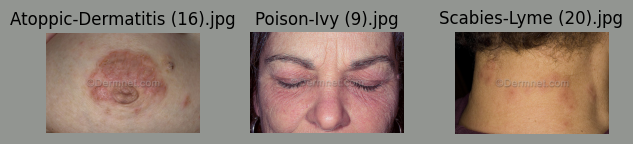

In [45]:
def show_images(img_files):
  plt.figure()
  fig = plt.figure(figsize=(10, 10))
  fig.patch.set_facecolor('xkcd:gray')

  for i in range(len(img_files)):
        plt.subplot(5,5,i+1)  
        img=mpimg.imread(img_files[i])
        plt.imshow(img)
        plt.tight_layout()
        plt.axis('off')
        plt.title(img_files[i].split("/")[7]) 
    
  plt.show()


def files(dir):
    arr = []
    for root, dirs, files in os.walk(dir):
        for name in files:
            if name.endswith('.jpg'):
              arr.append(os.path.join(root, name))
              break
    return arr


img_list = files(train_dir)
show_images(img_list)

# **Image Segmentation**

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


(-0.5, 149.5, 149.5, -0.5)

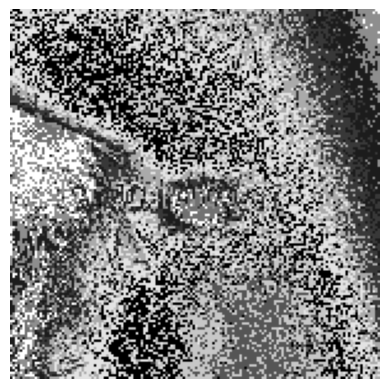

In [47]:
# KMeans for segmentation function
img_list =['/content/gdrive/MyDrive/new-skinnea-ds/train/Scabies-Lyme/Scabies-Lyme (10).jpg']
img_name = 'Scabies-Lyme (10).jpg'

img = image.load_img(
    img_list[0],
    target_size=(150, 150)
)

x = image.img_to_array(img)/255
kmeans = KMeans(10)
kmeans.fit(x.reshape(-1, 3))
segment = kmeans.predict(x.reshape(-1, 3)).reshape(x.shape[0], x.shape[1])


plt.imshow(segment,'gray')
plt.axis(False)

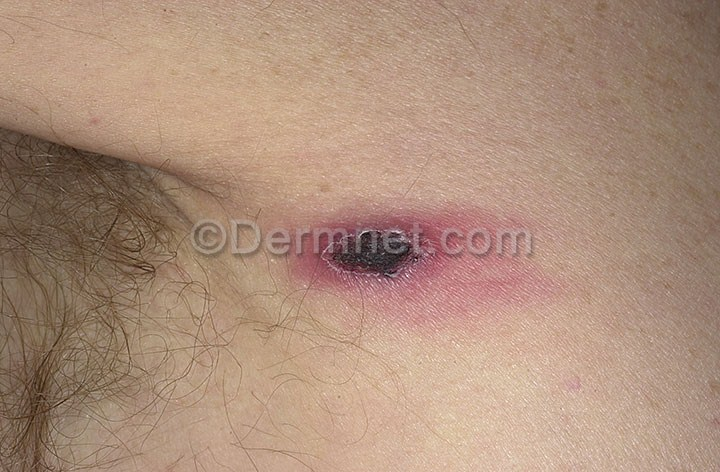

In [48]:
# Show the original image
img = cv2.imread(img_list[0])
cv2_imshow(img)

In [49]:
# Convert BGR color to RGB
# img = cv2.imread("/content/gdrive/MyDrive/new-skinnea-dataset/train/Scabies-Lyme/Scabies-Lyme(67).jpg")
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) 

# Resize to speed up the image recognition process
resized_image = img.reshape((-1, 3))
resized_image = np.float32(resized_image)
# cv2.imshow("Original Image", img)
# cv2.imshow("Resized Image", resized_image)
print(resized_image.shape)

(339840, 3)


<function matplotlib.pyplot.show(close=None, block=None)>

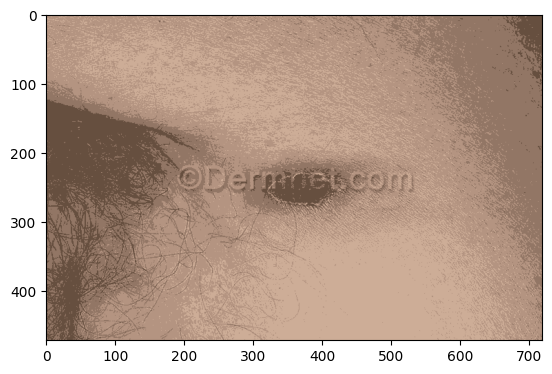

In [50]:
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2)


k=4
_, labels, (centers) = cv2.kmeans(resized_image, k, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)


centers = np.uint8(centers)
labels = labels.flatten()

img_segment = centers[labels.flatten()]
img_segment = img_segment.reshape(img.shape)
plt.imshow(img_segment)
plt.show

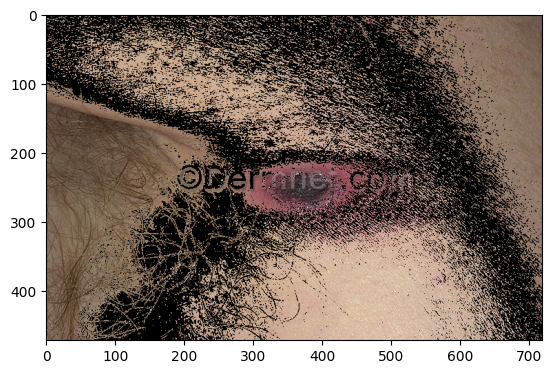

In [51]:
# Input the image path and the number of clusters
img_masked = np.copy(img)
img_masked = img_masked.reshape((-1, 3))
k_cluster = 2

img_masked[labels==k_cluster] = [0, 0, 0]
img_masked = img_masked.reshape(img.shape)

plt.imshow(img_masked)
plt.show()

In [52]:
# Create a segmentation function
def img_segmentation(img, k=4):
  resized_image = img.reshape((-1, 3))
  resized_image = np.float32(resized_image)

  criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2)

  _, labels, (centers) = cv2.kmeans(resized_image, k, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)
  centers=np.uint8(centers)
  labels = labels.flatten()
  img_segment = centers[labels.flatten()]
  img_segment = img_segment.reshape(img.shape)
  img_masked =  np.copy(img)
  img_masked = img_masked.reshape((-1, 3))
  cluster = 2
  img_masked[labels==cluster] = [0, 0, 0]
  img_masked = img_masked.reshape(img.shape)

  return img_masked

# **Pre-processing**

In [53]:
# Train and val set
datagen = ImageDataGenerator(preprocessing_function = img_segmentation,
                             rescale = 1./255,
                             rotation_range = 25,
                             zoom_range = [0.5, 1.1],
                             height_shift_range = 0.15,
                             width_shift_range = 0.15, 
                             shear_range = 0.15,
                             horizontal_flip = True,
                             vertical_flip = True,
                             fill_mode ='nearest',
                             )
IMG_SIZE = (224, 224)

# Test set
val_datagen = ImageDataGenerator(preprocessing_function = img_segmentation,
                                 rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

In [54]:
# Calculating train datasets
train_set = datagen.flow_from_directory(train_dir, 
                                        class_mode='categorical', 
                                        batch_size= 64,
                                        target_size=IMG_SIZE,
                                       )

Found 90 images belonging to 3 classes.


In [55]:
# Calculating val datasets
val_set = val_datagen.flow_from_directory(val_dir, 
                                          class_mode='categorical', 
                                          batch_size= 64,
                                          target_size=IMG_SIZE,
                                         )

Found 90 images belonging to 3 classes.


In [56]:
# Calculating test datasets
test_set = test_datagen.flow_from_directory(test_dir, 
                                          class_mode='categorical', 
                                          batch_size= 64,
                                          target_size=IMG_SIZE,
                                          )

Found 90 images belonging to 3 classes.


In [57]:
# Create variable
x_train, y_train = train_set.next()
x_test, y_test = test_set.next()
x_val, y_val = val_set.next()

x_train.shape

(64, 224, 224, 3)

In [58]:
# Create a augmentation
class_dir = {a : b for b, a in train_set.class_indices.items()}

def plot_augmented_imgs(x, y):
  labels=[]
  y_label = np.argmax(y, axis=1)
  
  for label in y_label:
      labels.append(class_dir[label])

  for idx in range(0,10):
      plt.figure(figsize=(5, 5))
      plt.title(labels[idx])
      plt.imshow(x[idx])
      # plt.imshow(x_train[idx])
      # plt.title(labels[idx])

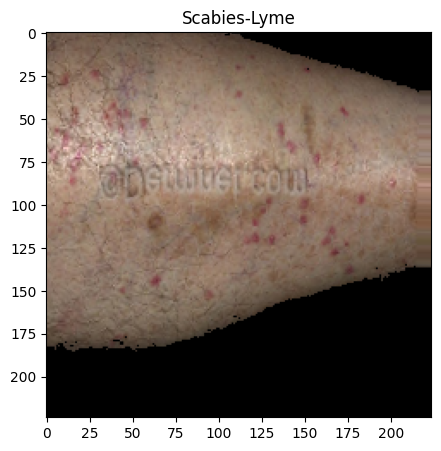

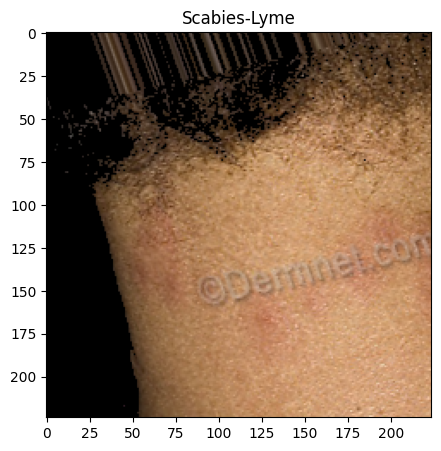

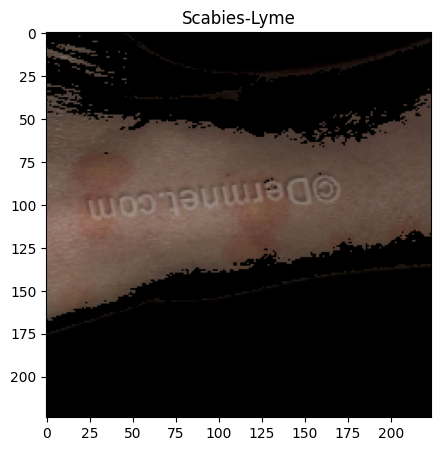

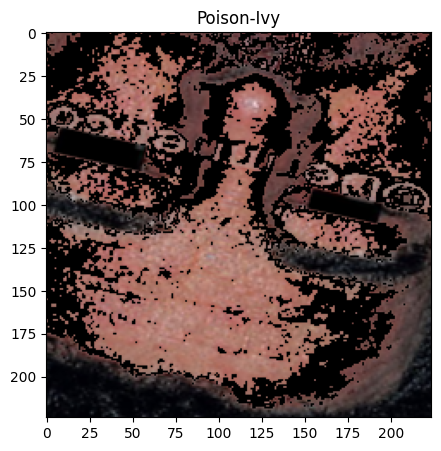

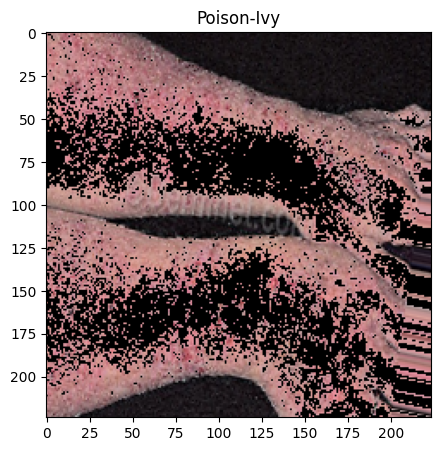

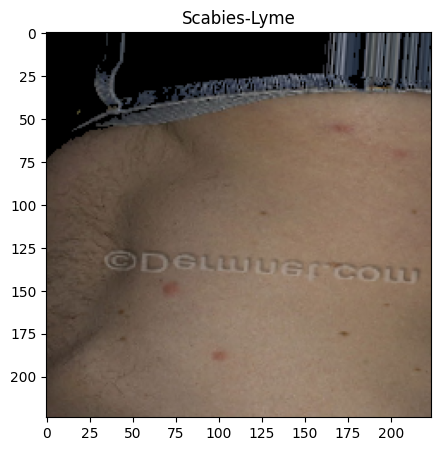

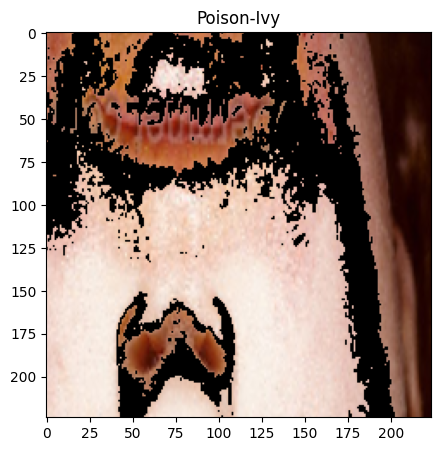

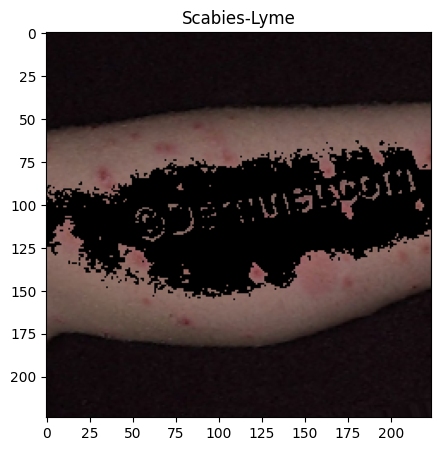

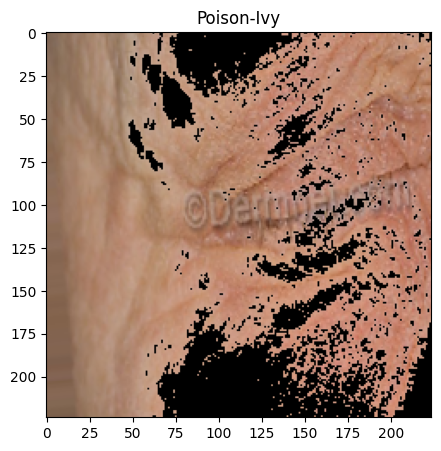

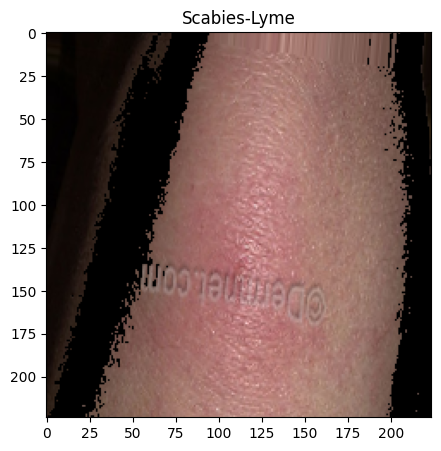

In [59]:
# Show train augmentation
plot_augmented_imgs(x_train, y_train)

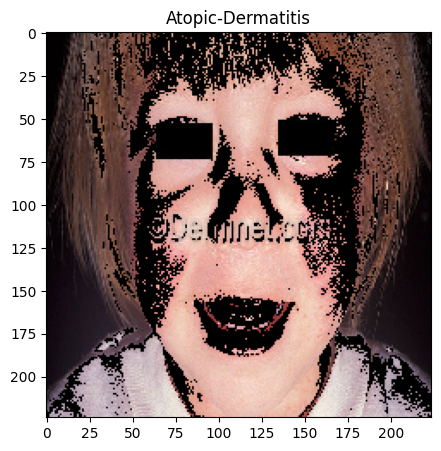

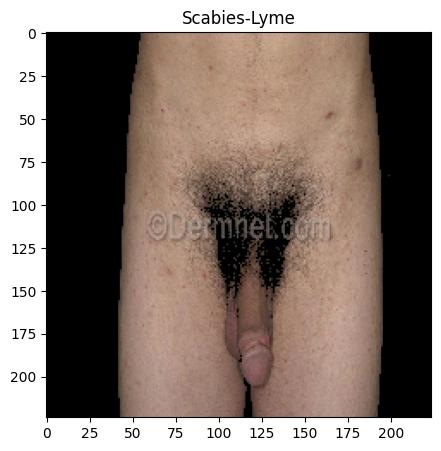

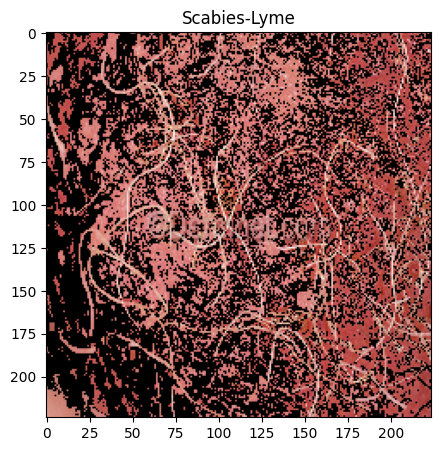

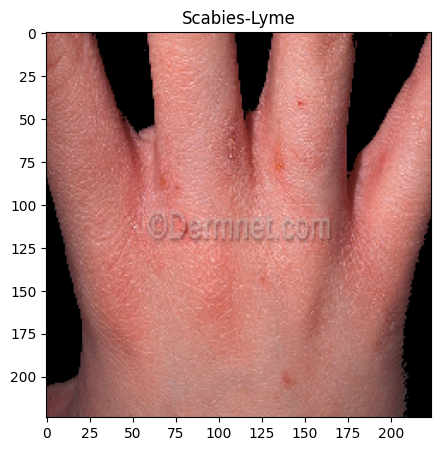

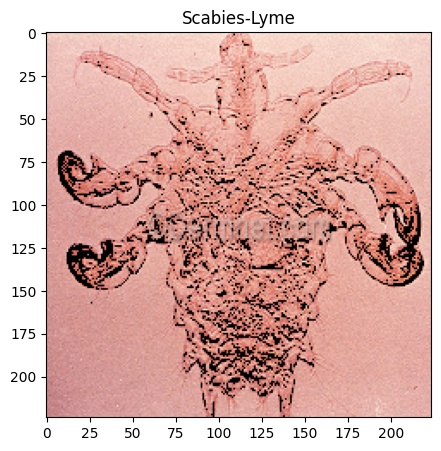

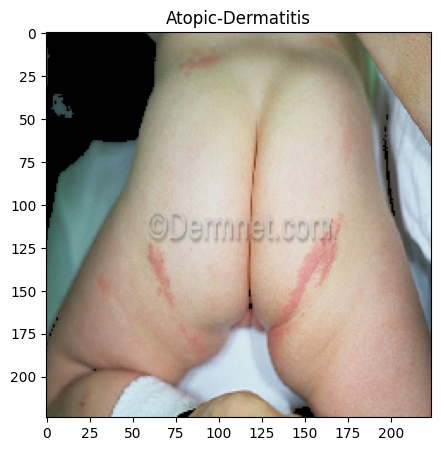

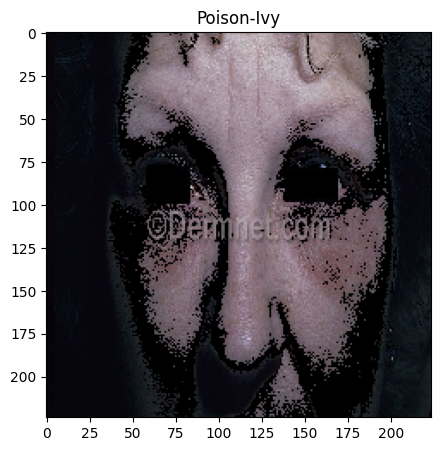

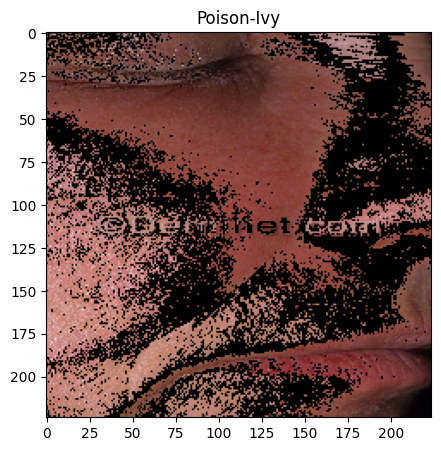

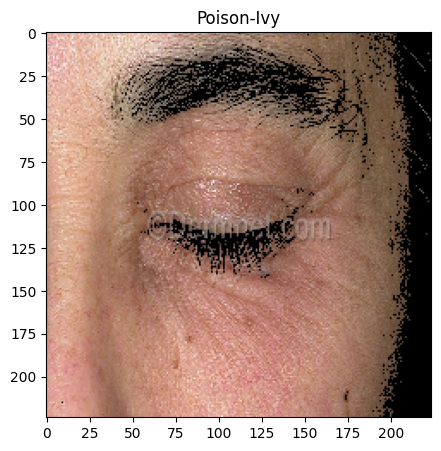

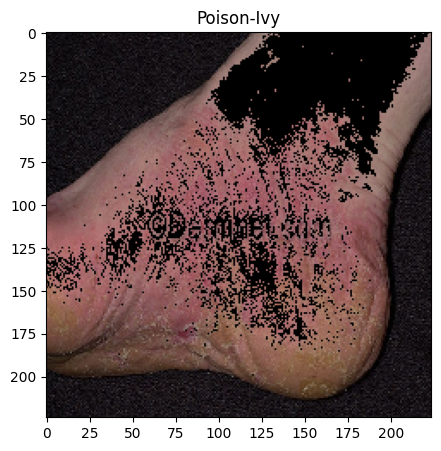

In [60]:
# Show val augmentation
plot_augmented_imgs(x_val, y_val)

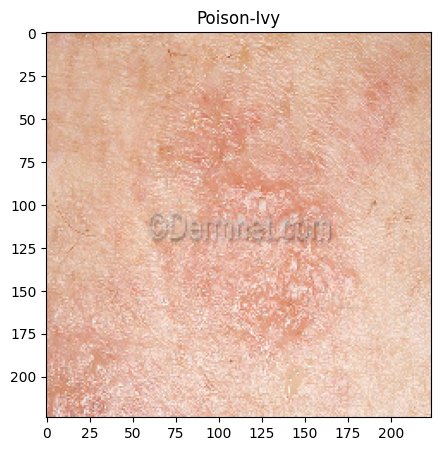

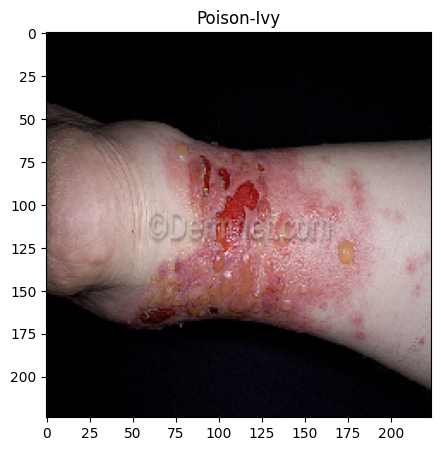

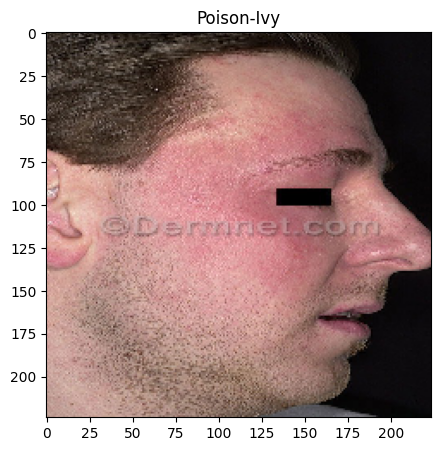

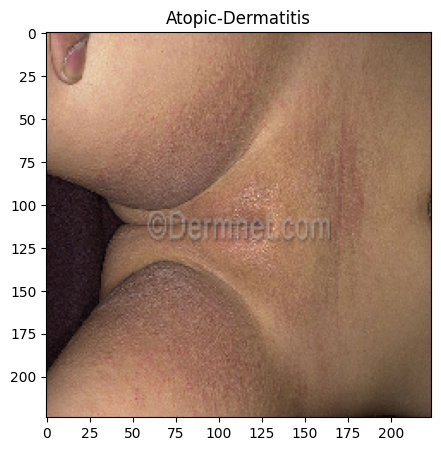

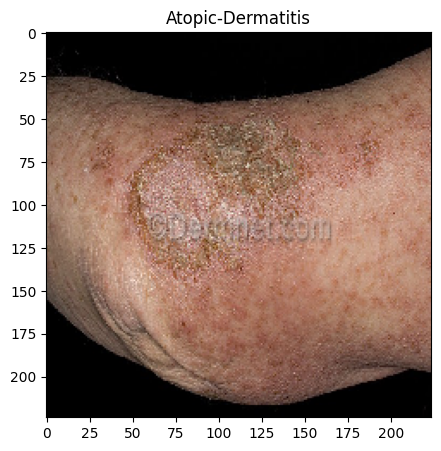

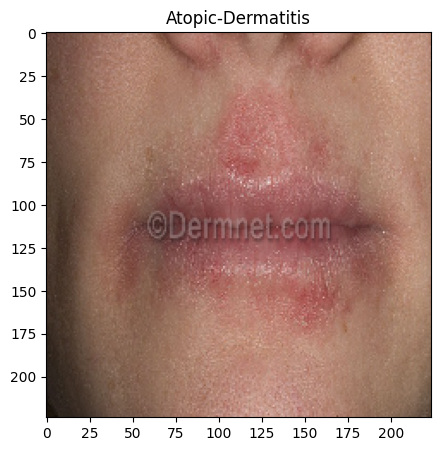

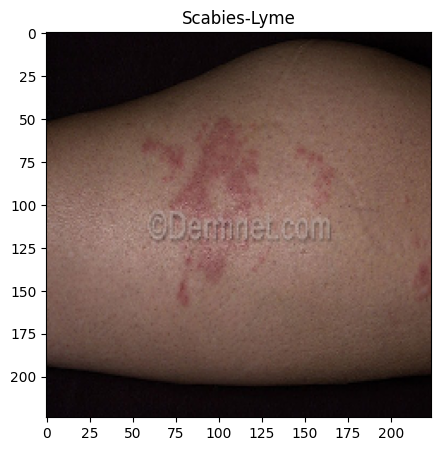

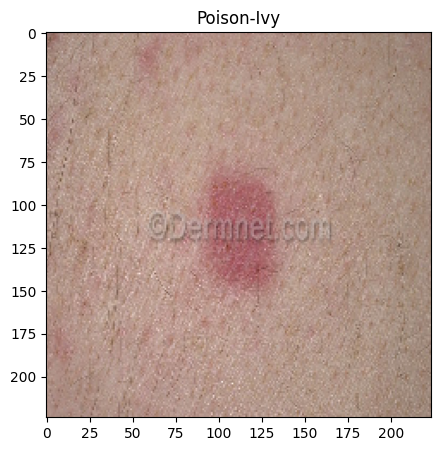

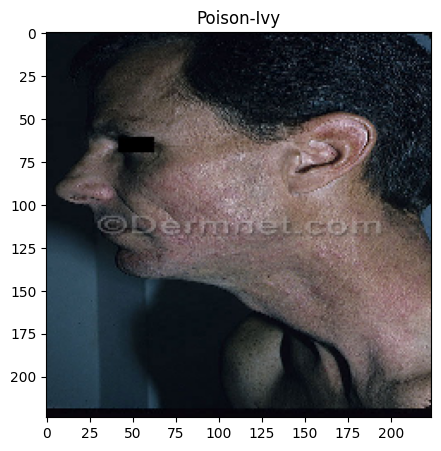

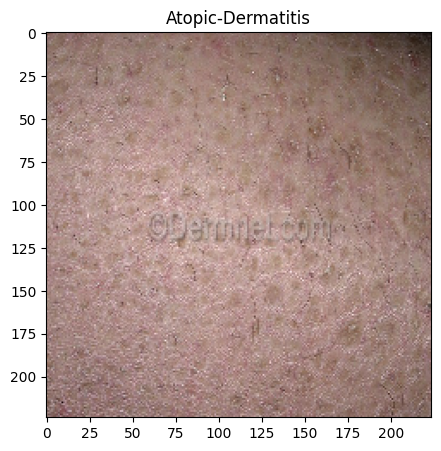

In [61]:
# Show test augmentation
plot_augmented_imgs(x_test, y_test)

# **Build The Model**

In [62]:
# Create a callback
reduce_lr = ReduceLROnPlateau(monitor='val_loss', min_lr=1e-8)
model_checkpoint = ModelCheckpoint("current_best_model.h5", saved_best_only=True)
early_stopping = EarlyStopping(patience=10,monitor='val_loss', restore_best_weights= True)

log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = TensorBoard(log_dir=log_dir, 
                                   histogram_freq=1)

callbacks =[reduce_lr, model_checkpoint, early_stopping, tensorboard_callback]

# Clear previous logs
!rm -rf ./logs/ 

In [63]:
# Show class indices
train_set.class_indices
val_set.class_indices
test_set.class_indices

{'Atopic-Dermatitis': 0, 'Poison-Ivy': 1, 'Scabies-Lyme': 2}

In [64]:
#Create evaluate model
def evaluate_model(model, X, y):
  predict = model.predict(X)
  predict = np.argmax(predict, axis=1)
  predict = predict.reshape(1, -1)[0]
  y_label = np.argmax(y, axis=1)
  print('Loss of the model is - ', model.evaluate(X, y)[0])
  print('Accuracy of the model is - ', model.evaluate(X, y)[1]*100, '%')
  print(classification_report(y_label, predict, target_names =['Atopic Dermatitis', 'Poison Ivy', 'Scabies Lyme']))

  conf_matrix = confusion_matrix(y_label, predict)
  data_frame = pd.DataFrame(conf_matrix, index = [i for i in ('Atopic Dermatitis', 'Poison Ivy', 'Scabies Lyme')],
                            columns = [i for i in ('Atopic Dermatitis', 'Poison Ivy', 'Scabies Lyme')])
  plt.figure(figsize = (3, 3))
  plt.style.use('seaborn-whitegrid')
  sns.heatmap(data_frame, annot=True)

# Create a plot
def plot_acc(history):
  acc = history.history['accuracy']
  val_acc = history.history['val_accuracy']
  epochs = range(len(acc))
  plt.subplot(1, 2, 1)
  acc_plot, = plt.plot(epochs, acc, 'green')
  val_acc_plot, = plt.plot(epochs, val_acc, 'blue')
  plt.title('Training and Validation Accuracy')
  plt.legend([acc_plot, val_acc_plot], ['Training Accuracy', 'Validation Accuracy'])

def plot_loss(history):
  loss = history.history['loss']
  val_loss = history.history['val_loss']
  epochs = range(len(loss))
  plt.subplot(1, 2, 2)
  loss_plot, = plt.plot(epochs, loss, 'green')
  val_loss_plot, = plt.plot(epochs, val_loss, 'blue')
  plt.title('Training and Validation Loss')
  plt.legend([loss_plot, val_loss_plot], ['Training Loss', 'Validation Loss'])

def plot_hist(history):
  plt.figure(figsize=(15,5))
  plot_acc(history)

In [27]:
# # Define xception based Model using 224, 224 input image and pooling max
# xception_based_model = Xception(weights='imagenet', input_shape=(224, 224 ,3), include_top=False, pooling='max')
# x = xception_based_model.output

# # Define the MLP for classification
# x = Dropout(0.5)(x)
# x = Dense(1024, activation='relu', kernel_regularizer=l2(0.001))(x)
# x = BatchNormalization()(x)
# x = Dense(512, activation='relu', kernel_regularizer=l2(0.001))(x)
# predictions = Dense(3, activation='softmax')(x)

# # Define the model
# model = Model(inputs=xception_based_model.input, outputs = predictions)

# # freeze all layer in xception_based_model for training process,
# for layer in xception_based_model.layers:
#   layer.trainable = False
# # optimizer=Adam()
# model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
# print(model.summary())

*Ini pake MLP jalan tapi pake CNN error (?)*

In [28]:

# xception_based_model = Xception(weights='imagenet', input_shape=(224, 224 ,3), include_top=False, pooling='max')
# x = xception_based_model.output

# model = Sequential()
# model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)))
# model.add(MaxPooling2D(pool_size=(2, 2)))
# model.add(Conv2D(64, (3, 3), activation='relu'))
# model.add(MaxPooling2D(pool_size=(2, 2)))
# model.add(Flatten())
# model.add(Dense(64, activation='relu'))
# model.add(Dense(10, activation='softmax'))
# model.summary()


# for layer in xception_based_model.layers:
#     layer.trainable = False
# optimizer=Adam()
# model.compile(loss='categorical_crossentropy', optimizer=optimizer, metrics=['accuracy'])
# print(model.summary())



In [29]:
# model = Sequential([
#     Conv2D(16, (3,3), padding='same', activation='relu', input_shape=(150, 150, 3)),
#     # BatchNormalization(),
#     Conv2D(16, (3,3), activation='relu'),
#     MaxPooling2D(2, 2),
#     Conv2D(32, (3, 3), activation='relu'),
#     MaxPooling2D(2, 2),
#     Conv2D(64, (3, 3), activation='relu'),
#     Conv2D(64, (3,3),  activation='relu'),
#     MaxPooling2D(2, 2),
#     Conv2D(256, (5,5), padding='same', activation='relu'),
#     Conv2D(256, (5, 5), padding='same', activation='relu'),
#     MaxPooling2D(2,2),
#     Flatten(),
#     Dense(512, activation='relu'),
#     Dense(3, activation='softmax')
# ])

# model.summary() 

In [30]:
# # optimizer=Adam()
# model.compile(
#     loss = 'categorical_crossentropy',
#     optimizer='adam',
#     metrics=['accuracy'],
# )
     

# **Transfer Learning**

*I've used MobileNetV2 and CNN for model evaluation but error(?)*
*

*Then I used Xception it worked!*

In [65]:
# Define xception based Model using 224, 224 input image and pooling max
based_model = Xception(weights='imagenet', input_shape=(224, 224 ,3), include_top=False, pooling='max')
x = based_model.output

# Define the MLP for classification
x = Dropout(0.5)(x)
x = Dense(1024, activation='relu', kernel_regularizer=l2(0.001))(x)
x = BatchNormalization()(x)
x = Dense(512, activation='relu', kernel_regularizer=l2(0.001))(x)
predictions = Dense(3, activation='softmax')(x)

# Define the model
model = Model(inputs=based_model.input, outputs = predictions)

# freeze all layer in based_model for training process,
for layer in based_model.layers:
    layer.trainable = False
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
print(model.summary())

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 111, 111, 32  864         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv1_bn (BatchNormaliz  (None, 111, 111, 32  128        ['block1_conv1[0][0]']           
 ation)                         )                                                           

In [32]:
# from keras.models import Sequential
# from keras.layers import Dense
# from keras.optimizers import Adam

# # Membuat model
# model = Sequential()
# model.add(Dense(64, activation='relu', input_dim=10))
# model.add(Dense(64, activation='relu'))
# model.add(Dense(1, activation='sigmoid'))

# # Mengompilasi model
# optimizer = Adam(learning_rate=0.001)
# model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])

# # # Melatih model
# # model.fit(X_train, y_train, batch_size=32, epochs=10, validation_data=(X_val, y_val))


In [33]:
# base_model = MobileNetV2(weights='imagenet', input_shape=(224, 224, 3), include_top=False, pooling='max') 

# x = GlobalAveragePooling2D()(x)
# x = Dense(1024,activation='relu')(x)
# x = Dense(1024,activation='relu')(x)
# x = Dense(512,activation='relu')(x)
# prediction = Dense(2,activation='softmax')(x) 

# model=Model(inputs=base_model.input,outputs=prediction)

In [66]:
EPOCHS = 15
history = model.fit(
    train_set,
    steps_per_epoch=train_set.samples // train_set.batch_size,
    epochs=EPOCHS,
    validation_data=val_set,
    validation_steps=val_set.samples // val_set.batch_size
)


Epoch 1/15
1/1 [==============================] - 174s 174s/step - loss: 3.5135 - accuracy: 0.2308 - val_loss: 4.3035 - val_accuracy: 0.3750
Epoch 2/15
1/1 [==============================] - 141s 141s/step - loss: 3.3431 - accuracy: 0.4375 - val_loss: 5.1923 - val_accuracy: 0.3438
Epoch 3/15
1/1 [==============================] - 167s 167s/step - loss: 3.2783 - accuracy: 0.5000 - val_loss: 5.5352 - val_accuracy: 0.3750
Epoch 4/15
1/1 [==============================] - 142s 142s/step - loss: 3.5288 - accuracy: 0.4219 - val_loss: 4.4554 - val_accuracy: 0.3438
Epoch 5/15
1/1 [==============================] - 143s 143s/step - loss: 2.8340 - accuracy: 0.7031 - val_loss: 4.9511 - val_accuracy: 0.3125
Epoch 6/15
1/1 [==============================] - 144s 144s/step - loss: 3.4106 - accuracy: 0.5625 - val_loss: 4.3464 - val_accuracy: 0.4219
Epoch 7/15
1/1 [==============================] - 111s 111s/step - loss: 3.0315 - accuracy: 0.5385 - val_loss: 4.2458 - val_accuracy: 0.3906
Epoch 8/15
1/

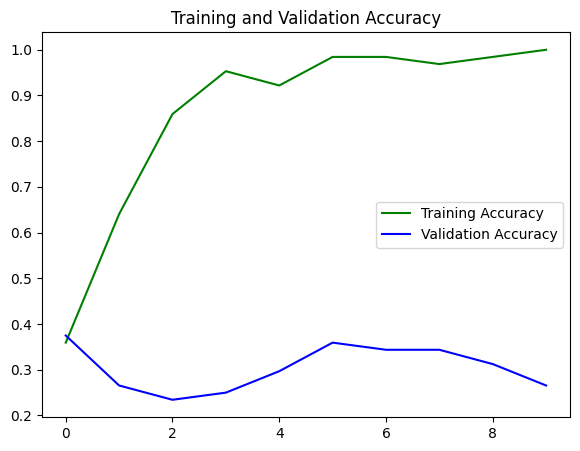

In [67]:
# Show a line graphics 10 epoch
plot_hist(hist)

In [31]:
# Train the model with 10 epochs
hist = model.fit(x_train, y_train, batch_size=32, epochs=10, validation_data=(x_val, y_val))


Epoch 1/10
2/2 [==============================] - 62s 49s/step - loss: 3.3727 - accuracy: 0.3594 - val_loss: 3.7969 - val_accuracy: 0.3750
Epoch 2/10
2/2 [==============================] - 41s 32s/step - loss: 2.7543 - accuracy: 0.6406 - val_loss: 4.6623 - val_accuracy: 0.2656
Epoch 3/10
2/2 [==============================] - 35s 27s/step - loss: 2.3978 - accuracy: 0.8594 - val_loss: 5.7396 - val_accuracy: 0.2344
Epoch 4/10
2/2 [==============================] - 35s 28s/step - loss: 2.2272 - accuracy: 0.9531 - val_loss: 5.5879 - val_accuracy: 0.2500
Epoch 5/10
2/2 [==============================] - 41s 33s/step - loss: 2.2996 - accuracy: 0.9219 - val_loss: 5.2104 - val_accuracy: 0.2969
Epoch 6/10
2/2 [==============================] - 36s 29s/step - loss: 2.1565 - accuracy: 0.9844 - val_loss: 5.4742 - val_accuracy: 0.3594
Epoch 7/10
2/2 [==============================] - 36s 27s/step - loss: 2.1242 - accuracy: 0.9844 - val_loss: 5.7810 - val_accuracy: 0.3438
Epoch 8/10
2/2 [===========

# **Evaluate the Model**

2/2 [==============================] - 15s 9s/step - loss: 4.1062 - accuracy: 0.5000
Loss of the model is -  4.106205463409424
2/2 [==============================] - 15s 7s/step - loss: 4.1062 - accuracy: 0.5000
Accuracy of the model is -  50.0 %
                   precision    recall  f1-score   support

Atopic Dermatitis       0.54      0.54      0.54        24
       Poison Ivy       0.46      0.86      0.60        21
     Scabies Lyme       1.00      0.05      0.10        19

         accuracy                           0.50        64
        macro avg       0.67      0.48      0.41        64
     weighted avg       0.65      0.50      0.43        64



<ipython-input-64-95b33bc4c266>:15: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')


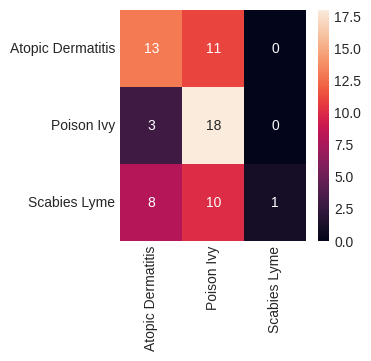

In [68]:
# Show evaluate train model
from sklearn.metrics import classification_report
evaluate_model(model, x_train, y_train)

2/2 [==============================] - 19s 8s/step - loss: 6.9407 - accuracy: 0.2500
Loss of the model is -  6.940680503845215
2/2 [==============================] - 14s 8s/step - loss: 6.9407 - accuracy: 0.2500
Accuracy of the model is -  25.0 %
                   precision    recall  f1-score   support

Atopic Dermatitis       0.26      0.35      0.30        20
       Poison Ivy       0.24      0.47      0.32        19
     Scabies Lyme       0.00      0.00      0.00        25

         accuracy                           0.25        64
        macro avg       0.17      0.27      0.21        64
     weighted avg       0.15      0.25      0.19        64



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
<ipython-input-64-95b33bc4c266>:15: MatplotlibDeprecationWarning

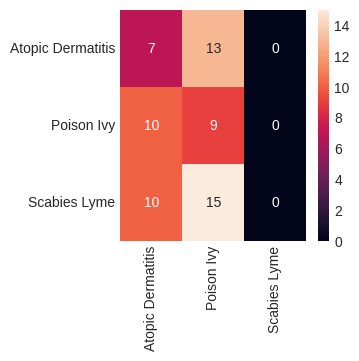

In [69]:
# Show evaluate val model
evaluate_model(model, x_val, y_val)

2/2 [==============================] - 15s 9s/step - loss: 5.2733 - accuracy: 0.3750
Loss of the model is -  5.273308277130127
2/2 [==============================] - 15s 6s/step - loss: 5.2733 - accuracy: 0.3750
Accuracy of the model is -  37.5 %
                   precision    recall  f1-score   support

Atopic Dermatitis       0.28      0.53      0.37        17
       Poison Ivy       0.47      0.56      0.51        25
     Scabies Lyme       0.50      0.05      0.08        22

         accuracy                           0.38        64
        macro avg       0.42      0.38      0.32        64
     weighted avg       0.43      0.38      0.33        64



<ipython-input-64-95b33bc4c266>:15: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')


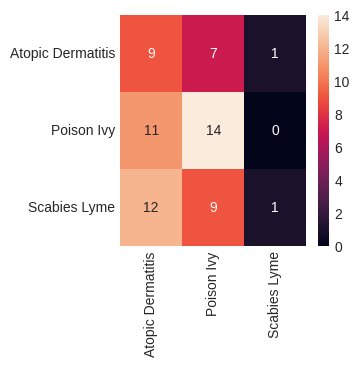

In [70]:
# Show evaluate test model
evaluate_model(model, x_test, y_test)

# **Check The Best Models**

In [71]:
import tensorflow as tf

# Check the best models
best_model = tf.keras.models.load_model('/content/gdrive/MyDrive/best-model-skinnea')

best_model.summary()

OSError: ignored

In [72]:
from google.colab import drive
drive.mount('/content/drive')

KeyboardInterrupt: ignored

In [ ]:
# Evaluate the best model
evaluate_model(best_model, X_test, y_test)

In [ ]:
# Save the best model in other drive
best_model.save('/content/gdrive/MyDrive/best-model-skinnea')

# **Testing Model**

In [73]:
# Testing model with random images
file_upload = files.upload()

files = len(file_upload)
fig = plt.figure(figsize=(2, 2 * files))

for i, filename in enumerate(file_upload):
  img = image.load_img(
        filename,
        target_size = (224, 224)
  )
  x = image.img_to_array(img)/255
  x = np.expand_dims(x, axis = 0)

  predict = model.predict(x)
  class_prediction = np.argmax(predict)
  other_prediction = class_dict[class_prediction]
  
  ax = fig.add_subplot(files, 1, i+1)
  ax.imshow(img)
  ax.set_title(other_prediction)
  ax.axis(False)
  print('percentage:')
  print(predict)

AttributeError: ignored